In [80]:
from plot_setup import *

# Utilities

## hms, dms -> deg

In [4]:
df = pd.read_csv("dra_sspp2.csv")
df

,RAh,RAm,RAs,pmDEd,DEm,DEs,Vlos,e_Vlos,Teff,e_Teff,logg,e_logg,FeH,e_FeH,N
0,17,20,2.76,57,48,57.2,-294.1,2.6,5923,752,3.7,1.0,-1.30,0.70,1
1,17,19,29.68,57,42,58.6,-205.1,1.1,4935,244,3.1,0.5,-1.73,0.32,1
2,17,19,44.45,57,47,27.3,-283.1,1.1,5113,264,3.0,0.5,-1.90,0.31,2
3,17,20,19.32,57,51,19.5,-277.5,1.1,4886,259,1.2,0.4,-1.89,0.31,1
4,17,20,0.93,57,45,11.2,-297.8,0.7,4646,130,1.7,0.3,-1.67,0.17,3
5,17,19,31.87,57,33,34.7,-309.9,0.4,4644,73,1.4,0.2,-3.24,0.07,5
6,17,20,21.12,57,49,27.2,-294.9,0.4,4680,59,1.0,0.1,-1.73,0.07,2
7,17,20,24.91,57,48,42.8,-310.9,1.0,4759,220,2.5,0.6,-1.69,0.29,2
8,17,20,18.60,57,46,1.1,-302.8,0.5,4792,90,1.4,0.2,-1.97,0.11,2
9,17,20,23.74,57,24,2.5,-63.0,0.8,5070,116,5.0,0.3,-1.25,0.14,1


In [5]:
import coord
df["RAdeg"] = coord.hms_to_deg(df.RAh,df.RAm,df.RAs)
df["DEdeg"] = coord.dms_to_deg(df.pmDEd,df.DEm,df.DEs)

In [9]:
df.to_csv("dra_sspp2_RADEdeg.csv",index=None)

# CMD cut

## Data set

### Spectroscopy Data: MMT

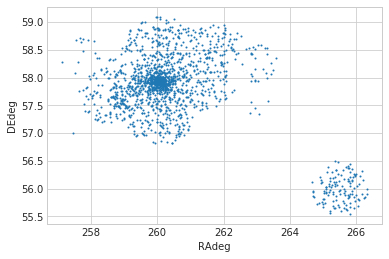

In [498]:
df = pd.read_csv("dra_sspp2_RADEdeg.csv")
df.plot.scatter("RAdeg","DEdeg",s=1)

### Photometry Data: SDSS

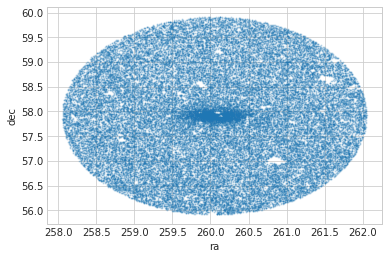

In [502]:
df_SDSS = pd.read_csv("Draco_SDSS.csv")
df_SDSS.plot.scatter("ra","dec",s=1,alpha=0.2)

## Matching

### Matching function 

In [512]:
def matching(source,table,angle_arcsec=1):
    ret = []
    for i in range(len(source)):
        star = source.iloc[i]
        is_near = ((table.ra-star.RAdeg)*np.cos(table.dec*6.28/360))**2 + (table.dec-star.DEdeg)**2 < (angle_arcsec/3600)**2
        ret.append(table[is_near])
    lens = [len(it) for it in ret]
    lens_unique = np.unique(lens)
    display([lens_unique,[lens.count(i) for i in lens_unique]])
    return ret,np.array(lens)

#candidates = []
#for i in range(len(df)):
#    st_spec = df.iloc[i]
#    is_near = (np.abs(df_SDSS.ra-st_spec.RAdeg) < 1/3600) & (np.abs(df_SDSS.dec-st_spec.DEdeg) < 1/3600)
#    df_SDSS[is_near]
#    candidates.append(df_SDSS[is_near])

### MMT - SDSS0 (circle) 

#### Matching

In [511]:
candidates_matched_SDSS0_in_1arcsec,candidates_matched_SDSS0_in_1arcsec_lens = matching(source=df,table=df_SDSS,angle_arcsec=1)

[array([0, 1]), [343, 1222]]

In [504]:
df_matched_SDSS0_in_1arcsec = df[np.array(candidates_matched_SDSS0_in_1arcsec_lens)==1]
df_unmatched_SDSS0_in_1arcsec = df[np.array(candidates_matched_SDSS0_in_1arcsec_lens)==0]
df_unmatched_SDSS0_in_1arcsec_ralessthan264 = df_unmatched_SDSS0_in_1arcsec[df_unmatched_SDSS0_in_1arcsec.RAdeg<264]
df_unmatched_SDSS0_in_1arcsec_ramorethan264 = df_unmatched_SDSS0_in_1arcsec[df_unmatched_SDSS0_in_1arcsec.RAdeg>=264]
#candidates1 = matching(source=df0,table=df_SDSS,angle_arcsec=5)

#### Result

Text(0.5,1,'MMT identification with SDSS0 (circle)\nidentification radius: 1 arcsec')

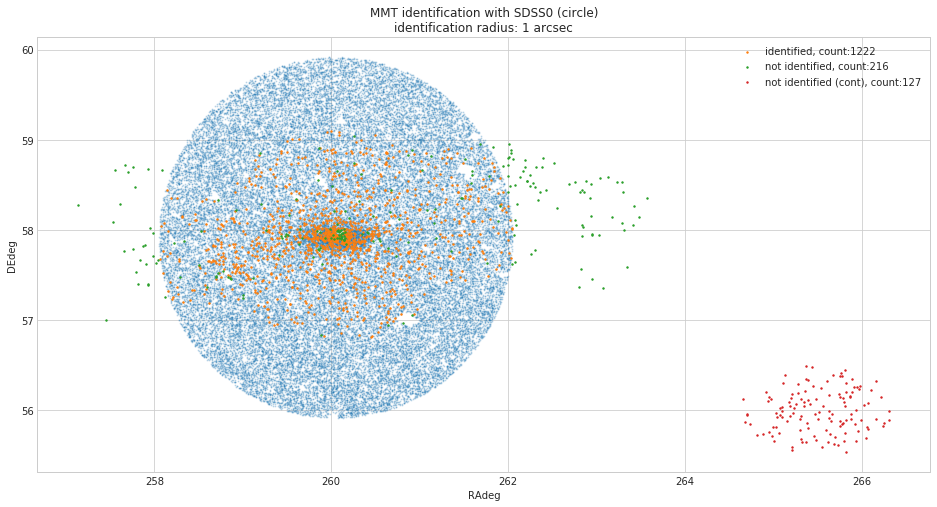

In [520]:
fig,ax = plt.subplots(1,1,figsize=(16,8))
df_SDSS.plot.scatter("ra","dec",s=1,alpha=0.2,ax=ax,c="C0")
df_matched_SDSS0_in_1arcsec.plot.scatter("RAdeg","DEdeg",s=2,ax=ax,c="C1",label="identified, count:{}".format(len(df_matched_SDSS0_in_1arcsec)))
df_unmatched_SDSS0_in_1arcsec_ralessthan264.plot.scatter("RAdeg","DEdeg",s=2,ax=ax,c="C2",label="not identified, count:{}".format(len(df_unmatched_SDSS0_in_1arcsec_ralessthan264)))
df_unmatched_SDSS0_in_1arcsec_ramorethan264.plot.scatter("RAdeg","DEdeg",s=2,ax=ax,c="C3",label="not identified (cont), count:{}".format(len(df_unmatched_SDSS0_in_1arcsec_ramorethan264)))
plt.title("MMT identification with SDSS0 (circle)\nidentification radius: 1 arcsec")

In [513]:
candidates_matched_SDSS0_in_15arcsec,candidates_matched_SDSS0_in_15arcsec_lens = matching(source=df,table=df_SDSS,angle_arcsec=5)

[array([0, 1, 2, 3]), [327, 1157, 78, 3]]

In [49]:
display(["in","out"])
display([len(df0[df0.RAdeg<264]),len(df0[df0.RAdeg>=264])])

['in', 'out']

[211, 127]

In [50]:
lens1 = [len(it) for it in candidates1]
[np.unique(lens1),lens1.count(0),lens1.count(1)]

[array([0, 1]), 331, 7]

In [51]:
df00 = df0[np.array(lens1)==0]
df01 = df0[np.array(lens1)==1]
candidates2 = []
for i in range(len(df00)):
    st_spec = df00.iloc[i]
    is_near = (np.abs(df_SDSS.ra-st_spec.RAdeg) < 15/3600) & (np.abs(df_SDSS.dec-st_spec.DEdeg) < 15/3600)
    df_SDSS[is_near]
    candidates2.append(df_SDSS[is_near])

In [52]:
lens2 = [len(it) for it in candidates2]
[np.unique(lens2),lens2.count(0),lens2.count(1)]

[array([0, 1, 2, 3, 4, 6]), 313, 11]

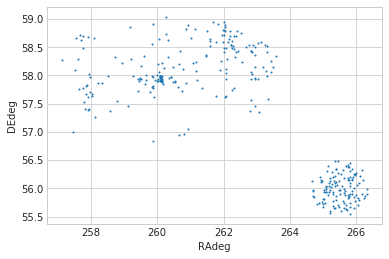

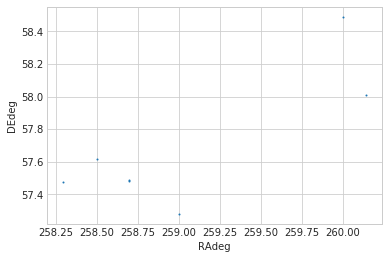

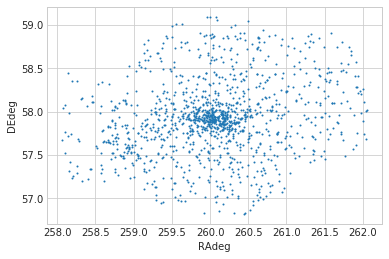

In [108]:
df00.plot.scatter("RAdeg","DEdeg",s=1)
df01.plot.scatter("RAdeg","DEdeg",s=1)
df1.plot.scatter("RAdeg","DEdeg",s=1)

#### CMD cut: MMT - SDSS0

(22, 14)

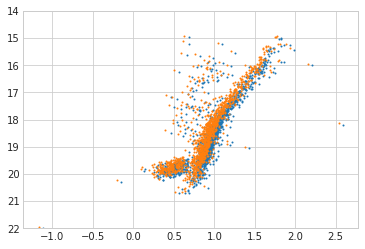

In [39]:
iMags,gMags = [],[]
ext_i,ext_g = [],[]
for candidate in candidates:
    if len(candidate) == 1:
        iMags.append(candidate.psfMag_i.values)
        gMags.append(candidate.psfMag_g.values)
        ext_i.append(candidate.extinction_i.values)
        ext_g.append(candidate.extinction_g.values)
iMags,gMags = np.array(iMags)[:,0],np.array(gMags)[:,0]
ext_i,ext_g = np.array(ext_i)[:,0],np.array(ext_g)[:,0]
iMags_True,gMags_True = (iMags-ext_i),(gMags-ext_g)

plt.scatter(gMags-iMags,iMags,s=1)
plt.scatter(gMags_True-iMag_true,iMags_True,s=1)
plt.ylim([22,14])

In [41]:
from inpoly import inpoly
cut = np.loadtxt("Draco_CMDcut.csv",delimiter=",")
is_inpoly = inpoly(x=cut[:,0],y=cut[:,1],sx=gMags_True-iMags_True,sy=iMags_True)
is_inpoly

[[ 0.55315883  0.84641732  1.07295951  2.1573286   1.74087863  0.77390458
   0.684392   -0.05496306 -0.35504897 -0.37905951  0.13744201  0.6009508 ]
 [20.74180652 20.73951544 18.23774558 14.69802394 14.71690246 18.19320694
  19.24078126 19.48093247 20.13952689 20.51471447 20.26067931 20.14768314]]
[[ 0.84641732  1.07295951  2.1573286   1.74087863  0.77390458  0.684392
  -0.05496306 -0.35504897 -0.37905951  0.13744201  0.6009508   0.55315883]
 [20.73951544 18.23774558 14.69802394 14.71690246 18.19320694 19.24078126
  19.48093247 20.13952689 20.51471447 20.26067931 20.14768314 20.74180652]]


array([ True,  True,  True, ...,  True,  True,  True])

[1123, 104]

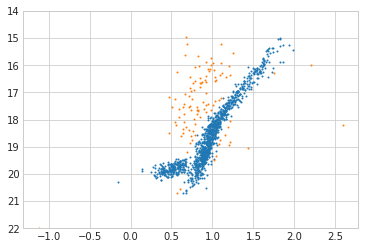

In [42]:
plt.scatter((gMags-iMags)[is_inpoly],iMags[is_inpoly],s=1)
plt.scatter((gMags-iMags)[np.logical_not(is_inpoly)],iMags[np.logical_not(is_inpoly)],s=1)
plt.ylim([22,14])
display([len(is_inpoly[is_inpoly==True]),len(is_inpoly[is_inpoly==False])])

### MMT(after 1st matching) - SDSS1 (rectangle)

#### Data set: SDSS1
The data set *SDSS1* contains both *clean* (clean=1) and *dirty* (clean=0) stars.

array([1336, 1339, 1356, 1359, 2392, 2574, 3358, 4015])

208688

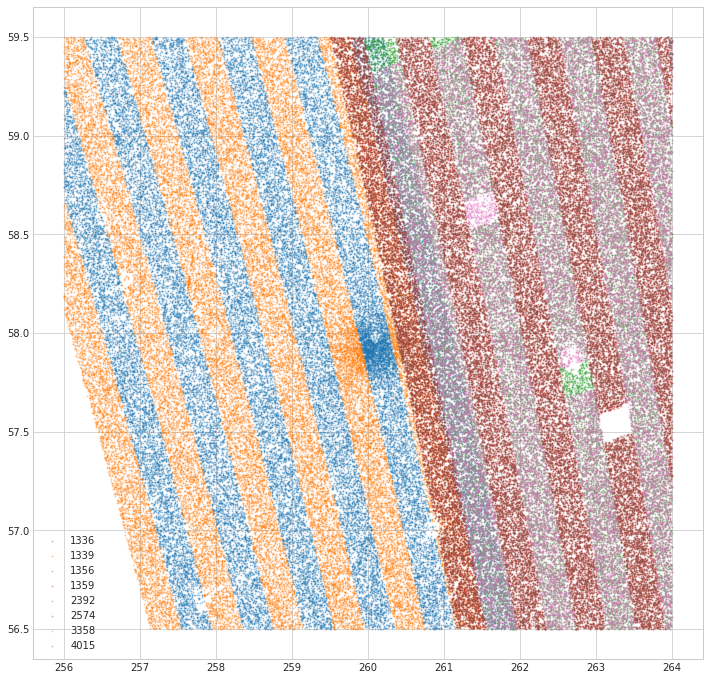

In [378]:
df_SDSS1 = pd.read_csv("Skyserver_SQL10_26_2018 8_51_24 AM.csv",comment="#")
df_SDSS1_cleaned = df_SDSS2[df_SDSS2.clean==1]

#df_SDSS2[::].plot.scatter("ra","dec",s=0.1,by="field",c=("C0","C1","C2","C3"))
plt.figure(figsize=(12,12))
keys = df_SDSS1.run
display(np.unique(keys))
[plt.scatter(df_SDSS1[keys==key].ra,df_SDSS2[keys==key].dec,s=1,label=str(key),alpha=0.3) for key in np.unique(keys)[:] ]
plt.legend()
len(df_SDSS1)


#### Matching

In [390]:
#display(len(df_unmatched_SDSS0_in_1arcsec_ralessthan264))
candidates_matched_SDSS1but0_in_1arcsec,candidates_matched_SDSS1but0_in_1arcsec_lens = matching(
    source=df_unmatched_SDSS0_in_1arcsec_ralessthan264,
    table=df_SDSS1_cleaned,
    angle_arcsec=1)
df_matched_SDSS1but0_in_1arcsec = df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSS1but0_in_1arcsec_lens==1]
df_unmatched_SDSS0and1_in_1arcsec = df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSS1but0_in_1arcsec_lens==0]

[array([0, 1]), [126, 90]]

In [474]:
#dirty, 1 arcsec
candidates_matched_SDSSdirty1but0_in_1arcsec,candidates_matched_SDSSdirty1but0_in_1arcsec_lens = matching(
    source=df_unmatched_SDSS0_in_1arcsec_ralessthan264,
    table=df_SDSS1,
    angle_arcsec=1)
df_matched_SDSSdirty1but0_in_1arcsec = df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSSdirty1but0_in_1arcsec_lens>0]
list_df_matched_SDSSdirty1but0_in_1arcsec = [df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSSdirty1but0_in_1arcsec_lens==i] for i in range(4)]
df_unmatched_SDSS0anddirty1_in_1arcsec = df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSSdirty1but0_in_1arcsec_lens==0]

[array([0, 1, 2, 3]), [50, 72, 85, 9]]

In [480]:
# dirty, n arcsec
n_arcsec = 5
candidates_matched_SDSSdirty1but0_in_narcsec,candidates_matched_SDSSdirty1but0_in_narcsec_lens = matching(
    source=df_unmatched_SDSS0_in_1arcsec_ralessthan264,
    table=df_SDSS1,
    angle_arcsec=n_arcsec)
df_matched_SDSSdirty1but0_in_narcsec = df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSSdirty1but0_in_narcsec_lens>0]
list_df_matched_SDSSdirty1but0_in_narcsec = [df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSSdirty1but0_in_narcsec_lens==i] for i in range(4)]
df_unmatched_SDSS0anddirty1_in_narcsec = df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSSdirty1but0_in_narcsec_lens==0]

[array([0, 1, 2, 3, 4, 5]), [36, 80, 82, 10, 7, 1]]

#### Result

##### Dirty SDSS

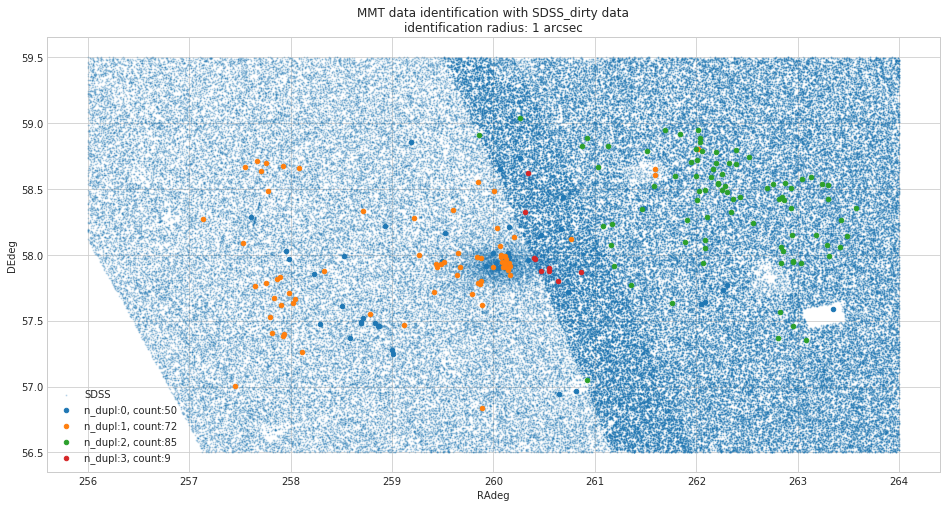

In [493]:
#display(df0[df0.RAdeg<264][df_aftermatchof_SDSS_SDSS2_lens==1])
fig,ax = plt.subplots(1,1,figsize=(16,8))
df_SDSS1.plot.scatter("ra","dec",s=1,ax=ax,c="C0",alpha=0.2,label="SDSS")
#df_unmatched_SDSS0and1_in_1arcsec.plot.scatter("RAdeg","DEdeg",ax=ax,c="C1",label="not identified")
#df_matched_SDSS1but0_in_1arcsec.plot.scatter("RAdeg","DEdeg",ax=ax,c="C2",label="identified")
cs = ["C{}".format(i) for i in range(4)]
[list_df_matched_SDSSdirty1but0_in_1arcsec[i].plot.scatter(
    "RAdeg","DEdeg",
    ax=ax,c=cs[i],
    label="n_dupl:{}, count:{}".format(i,np.sum(candidates_matched_SDSSdirty1but0_in_1arcsec_lens==i))) for i in range(4)]
plt.title("MMT data identification with SDSS_dirty data\nidentification radius: 1 arcsec")
plt.legend()
#plt.xlim((260,261))
#plt.ylim((260,261))

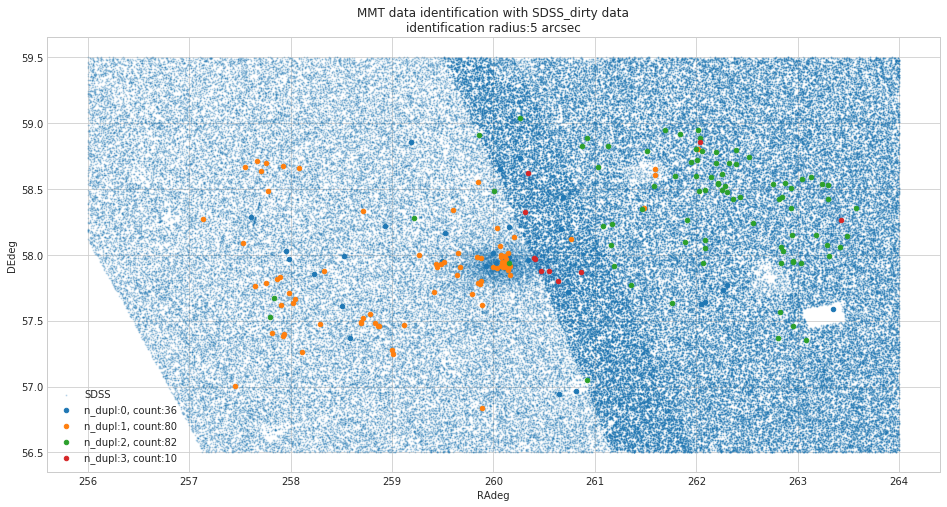

In [494]:
fig,ax = plt.subplots(1,1,figsize=(16,8))
df_SDSS1.plot.scatter("ra","dec",s=1,ax=ax,c="C0",alpha=0.2,label="SDSS")
#df_unmatched_SDSS0and1_in_1arcsec.plot.scatter("RAdeg","DEdeg",ax=ax,c="C1",label="not identified")
#df_matched_SDSS1but0_in_1arcsec.plot.scatter("RAdeg","DEdeg",ax=ax,c="C2",label="identified")
cs = ["C{}".format(i) for i in range(4)]
[list_df_matched_SDSSdirty1but0_in_narcsec[i].plot.scatter(
    "RAdeg","DEdeg",
    ax=ax,c=cs[i],
    label="n_dupl:{}, count:{}".format(i,np.sum(candidates_matched_SDSSdirty1but0_in_narcsec_lens==i))) for i in range(4)]
plt.title("MMT data identification with SDSS_dirty data\nidentification radius:{} arcsec".format(n_arcsec))
plt.legend()

##### Clean SDSS

Text(0.5,1,'MMT data identification with SDSS_clean data')

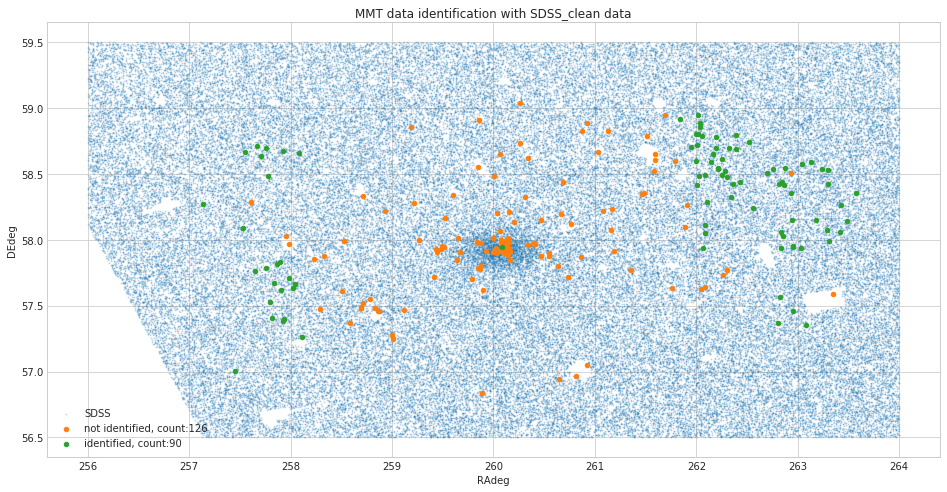

In [519]:
fig,ax = plt.subplots(1,1,figsize=(16,8))
df_SDSS1_cleaned.plot.scatter("ra","dec",s=1,ax=ax,c="C0",alpha=0.2,label="SDSS")
df_unmatched_SDSS0and1_in_1arcsec.plot.scatter(
    "RAdeg","DEdeg",ax=ax,c="C1",
    label="not identified, count:{}".format(np.sum(candidates_matched_SDSS1but0_in_1arcsec_lens==0)))
df_matched_SDSS1but0_in_1arcsec.plot.scatter(
    "RAdeg","DEdeg",
    ax=ax,c="C2",
    label="identified, count:{}".format(np.sum(candidates_matched_SDSS1but0_in_1arcsec_lens==1)))
plt.title("MMT data identification with SDSS_clean data")

In [429]:
def plot_around(source,table,dx=10,dy=10,figsize=(12,12),subplots=False):
    dx,dy = dx/3600, dy/3600
    n = len(source)
    if subplots:
        fig,axes = plt.subplots(*(np.ceil(np.sqrt([n,n])).astype(int)),figsize=figsize)
        axes = axes.reshape((-1))
    else:
        fig,axes = plt.subplots(1,1,figsize=figsize)
        
    
    for i in range(n):
        ax = axes[i] if subplots else axes
        
        star = source.iloc[i]
        x0,y0 = star.RAdeg,star.DEdeg
        xs,ys = table.ra,table.dec
        is_near_from_x0y0 = (np.abs(xs-x0)<dx) & (np.abs(ys-y0)<dy)
        xs,ys = xs[is_near_from_x0y0],ys[is_near_from_x0y0]
        ax.scatter(xs,ys,c="C0",alpha=0.5,label="neibours")
        #star.plot.scatter("RAdeg","DEdeg",ax=ax,c="C1")
        ax.scatter(x0,y0,c="C1",alpha=0.5,label="host")
        if subplots:
            ax.set_xlim((x0-dx,x0+dx))
            ax.set_ylim((y0-dy,y0+dy))
            ax.legend()
        elif i==0:
            plt.legend()
    
        


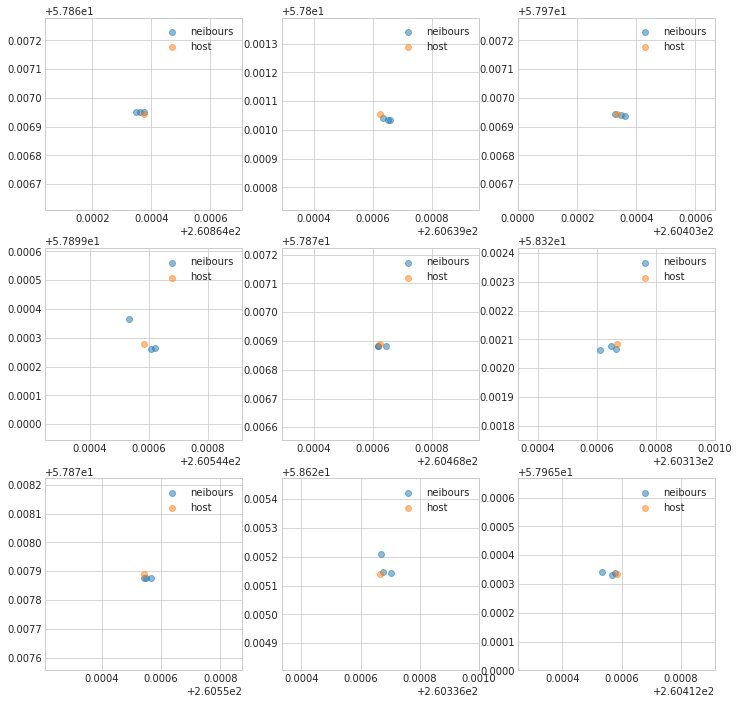

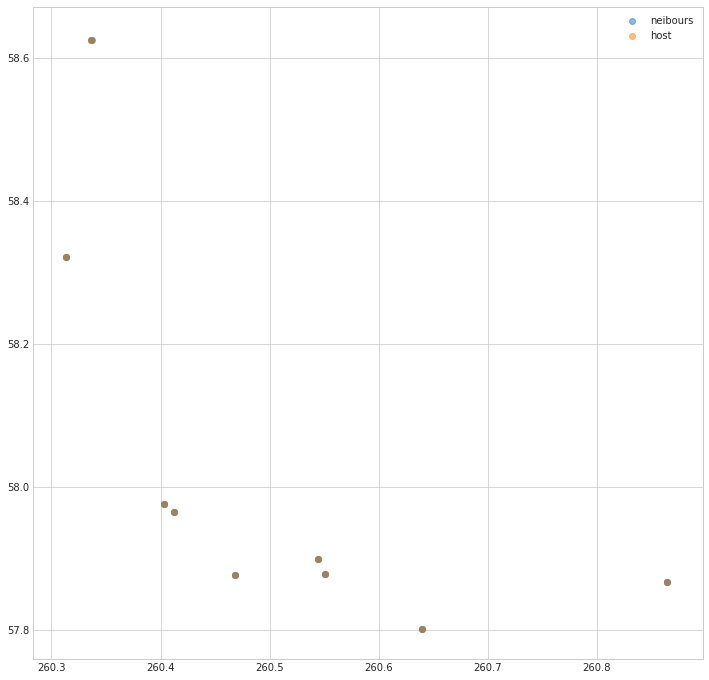

In [430]:
plot_around(df0[df0.RAdeg<264][candidates_matched_SDSSdirty1but0_in_1arcsec_lens==3],df_SDSS2,dx=1.2,dy=1.2,subplots=True)
plot_around(df0[df0.RAdeg<264][candidates_matched_SDSSdirty1but0_in_1arcsec_lens==3],df_SDSS2,dx=1.2,dy=1.2,subplots=False)

Text(0.5,1,'Not identified MMT stars with SDSS_dirty data and these neibours')

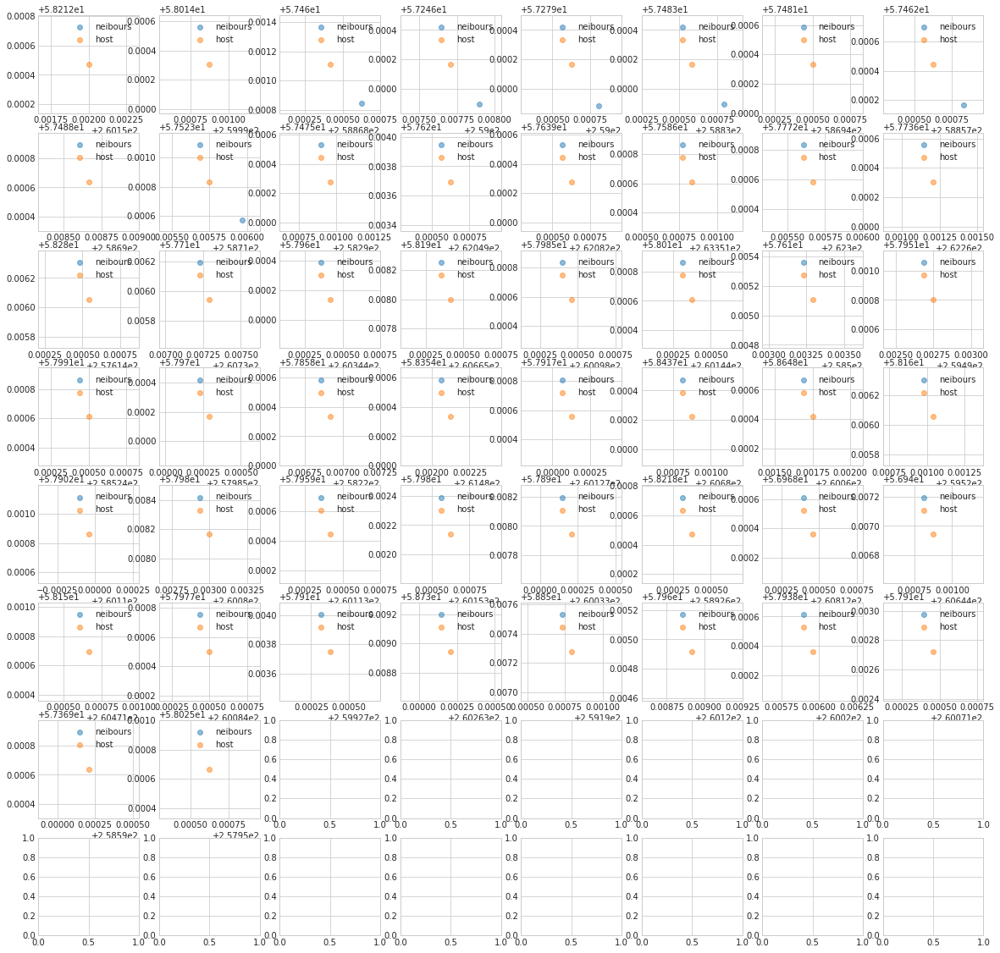

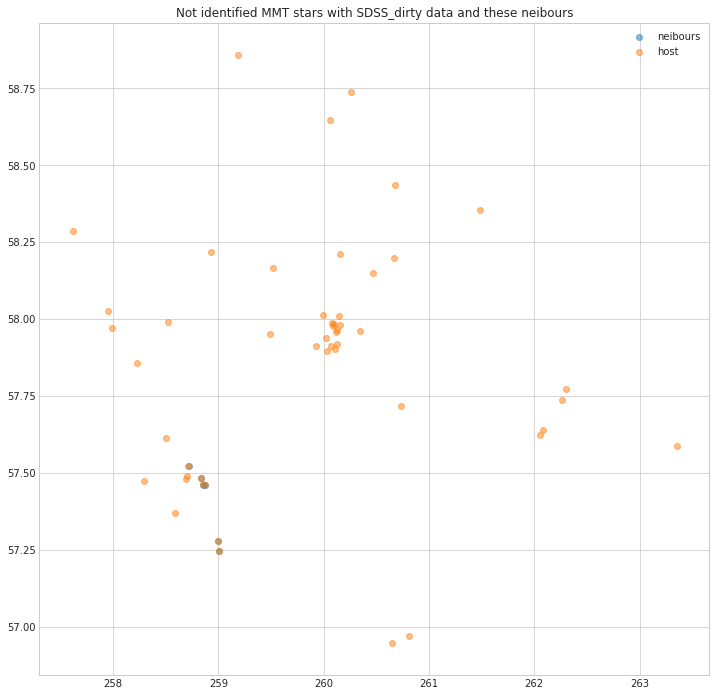

In [433]:
plot_around(df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSSdirty1but0_in_1arcsec_lens==0],df_SDSS1,dx=1.2,dy=1.2,subplots=True,figsize=(20,20))
plot_around(df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSSdirty1but0_in_1arcsec_lens==0],df_SDSS1,dx=1.2,dy=1.2,subplots=False)
plt.title("Not identified MMT stars with SDSS_dirty data and these neibours")

Text(0.5,1,'Not identified MMT stars with SDSS_clean data and these neibours')

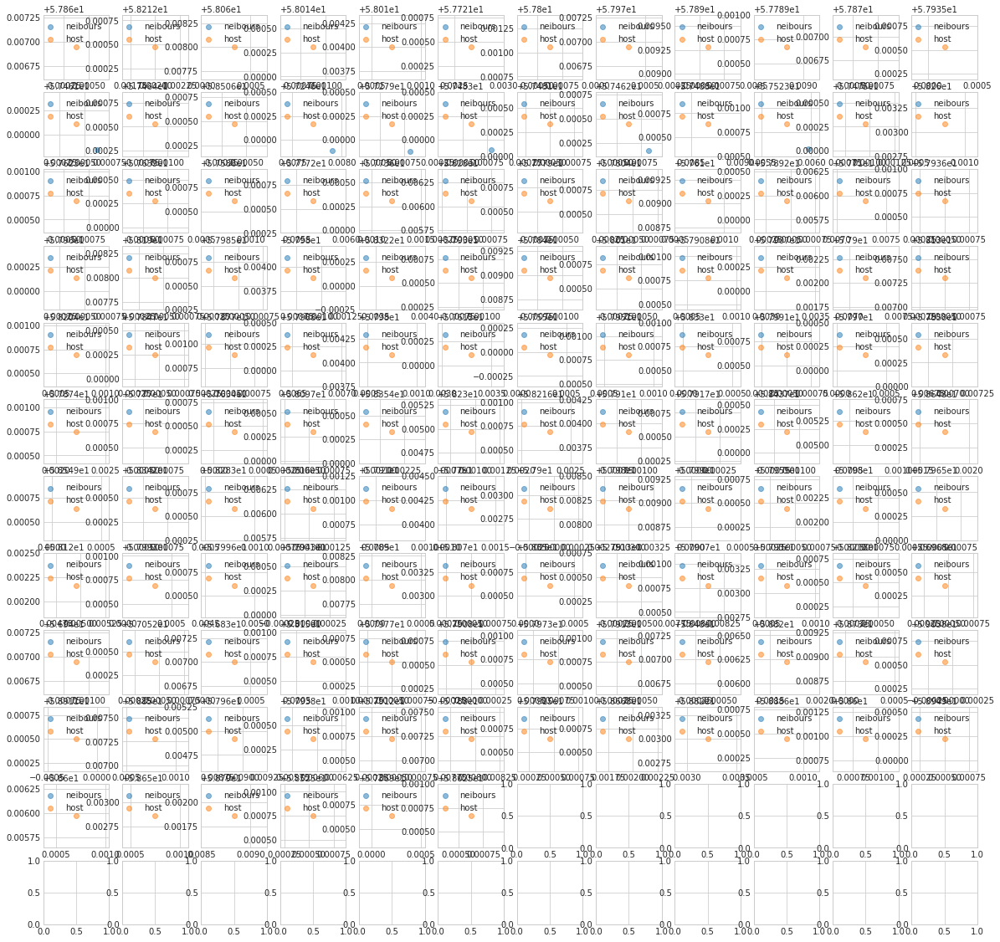

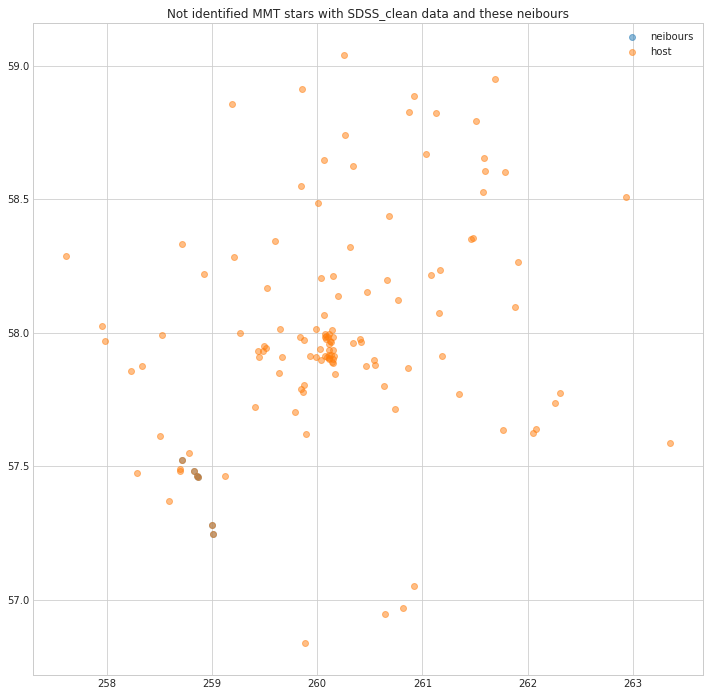

In [434]:
plot_around(df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSS1but0_in_1arcsec_lens==0],df_SDSS1_cleaned,dx=1.2,dy=1.2,subplots=True,figsize=(20,20))
plot_around(df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSS1but0_in_1arcsec_lens==0],df_SDSS1_cleaned,dx=1.2,dy=1.2,subplots=False,figsize=(12,12))
plt.title("Not identified MMT stars with SDSS_clean data and these neibours")

### Matching: MMT <-> SDSS_cont (control region)

#### Data set: SDSS_cont

In [ ]:
df_SDSS_cont = pd.read_csv("Skyserver_SQL10_26_2018 11_00_12 AM_cont.csv",comment="#")
df_SDSS_cont_cleaned = df_SDSS_cont[df_SDSS_cont.clean==1]
display(df_SDSS_cont.columns)

Index(['objid', 'ra', 'dec', 'u', 'psfMag_u', 'psfMag_g', 'psfMag_r',
       'psfMag_i', 'psfMag_z', 'extinction_u', 'extinction_g', 'extinction_r',
       'extinction_i', 'extinction_z', 'run', 'rerun', 'camcol', 'field',
       'clean'],
      dtype='object')

array([0, 1])

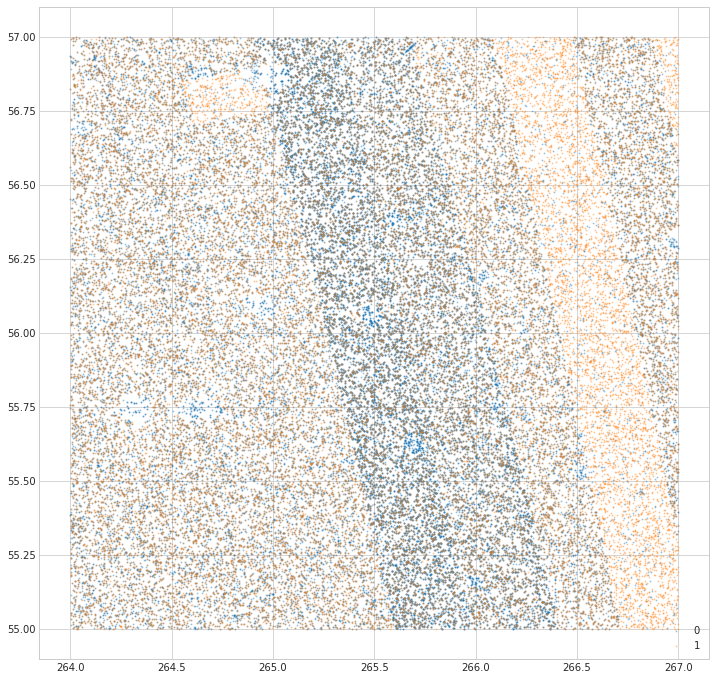

In [442]:
plt.figure(figsize=(12,12))
keys = df_SDSS_cont.clean
display(np.unique(keys))
[plt.scatter(df_SDSS_cont[keys==key].ra,df_SDSS_cont[keys==key].dec,s=1,label=str(key),alpha=0.3) for key in np.unique(keys)[:] ]
plt.legend()

#### Matching

In [473]:
df_cont = df[df.RAdeg>=264]
# dirty
candidates_matched_SDSS_dirtycont_in_1arcsec,candidates_matched_SDSS_dirtycont_in_1arcsec_lens = matching(
    angle_arcsec=1,source=df_cont,table=df_SDSS_cont)
# clean
candidates_matched_SDSS_cont_in_1arcsec,candidates_matched_SDSS_cont_in_1arcsec_lens = matching(
    angle_arcsec=1,source=df_cont,table=df_SDSS_cont_cleaned)


[array([0, 1, 2, 3, 4, 5]), [3, 2, 47, 39, 35, 1]]

[array([0, 1]), [11, 116]]

In [466]:
list_df_matched_SDSS_dirtycont_in_1arcsec = [df_cont[candidates_matched_SDSS_dirtycont_in_1arcsec_lens==i] for i in range(6)]
list_df_matched_SDSS_cleancont_in_1arcsec = [df_cont[candidates_matched_SDSS_cont_in_1arcsec_lens==i] for i in range(2)]

#### Result

Text(0.5,1,'MMT cont data identification with SDSS_dirty data')

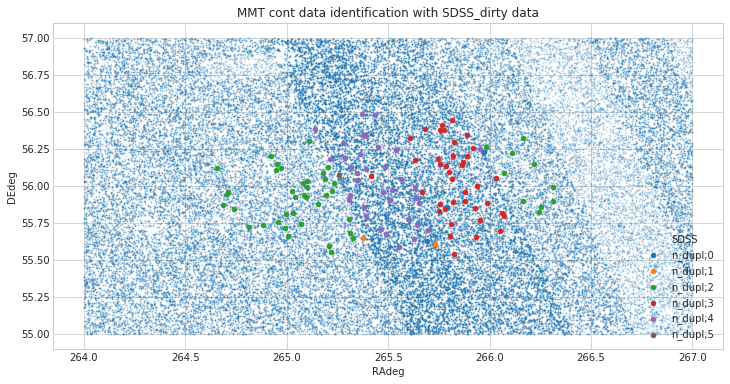

In [465]:
fig,ax = plt.subplots(1,1)
df_SDSS_cont.plot.scatter("ra","dec",s=1,alpha=0.2,label="SDSS",ax=ax,figsize=(12,6))
cs = ["C{}".format(i) for i in range(6)]
[list_df_matched_SDSS_dirtycont_in_1arcsec[i].plot.scatter("RAdeg","DEdeg",label="n_dupl;{}".format(i),c=cs[i],ax=ax) for i in range(6)]
plt.legend()
plt.title("MMT cont data identification with SDSS_dirty data")

Text(0.5,1,'MMT cont data identification with SDSS_clean data')

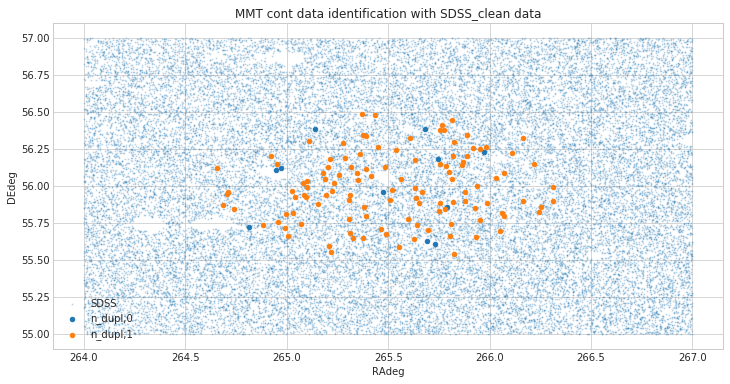

In [468]:
fig,ax = plt.subplots(1,1)
df_SDSS_cont_cleaned.plot.scatter("ra","dec",s=1,alpha=0.2,label="SDSS",ax=ax,figsize=(12,6))
cs = ["C{}".format(i) for i in range(2)]
[list_df_matched_SDSS_cleancont_in_1arcsec[i].plot.scatter("RAdeg","DEdeg",label="n_dupl;{}".format(i),c=cs[i],ax=ax) for i in range(2)]
plt.legend()
plt.title("MMT cont data identification with SDSS_clean data")

In [214]:
df[df.RAdeg>264][matchres_cont[1] == 5]

,RAh,RAm,RAs,pmDEd,DEm,DEs,Vlos,e_Vlos,Teff,e_Teff,logg,e_logg,FeH,e_FeH,N,RAdeg,DEdeg
612,17,41,2.02,56,4,22.0,-17.6,0.6,4945,75,5.1,0.2,-0.21,0.09,1,265.258417,56.072778


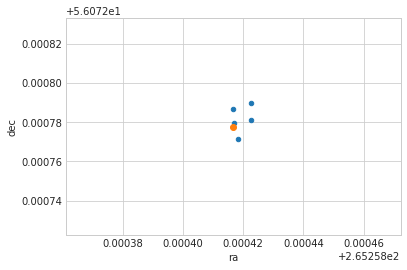

In [216]:
plot_around(df[df.RAdeg>264][matchres_cont[1] == 5],df_SDSS_cont,dx=0.2,dy=0.2)

(22, 14)

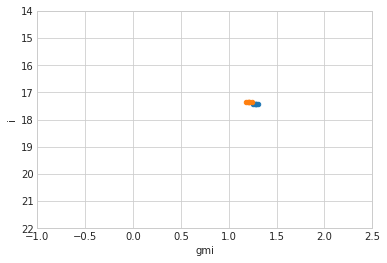

In [270]:
pltdf = pd.DataFrame(matchres_cont[0][np.where(matchres_cont[1] == 5)[0][0]])
pltdf["i"] = pltdf.psfMag_i - pltdf.extinction_i
pltdf["g"] = pltdf.psfMag_g - pltdf.extinction_g
pltdf["gmi"] = pltdf.g - pltdf.i
pltdf["psfMag_gmi"] = pltdf.psfMag_g - pltdf.psfMag_i
fig,ax = plt.subplots(1,1)
#matchres_cont[0][np.where(matchres_cont[1] == 5)[0][0]].plot.scatter("psfMag_gmi","psfMag_i",ax=ax,c="C0")
pltdf.plot.scatter("psfMag_gmi","psfMag_i",ax=ax,c="C0")
pltdf.plot.scatter("gmi","i",ax=ax,c="C1")
plt.xlim((-1,2.5))
plt.ylim((22,14))

(22, 19)

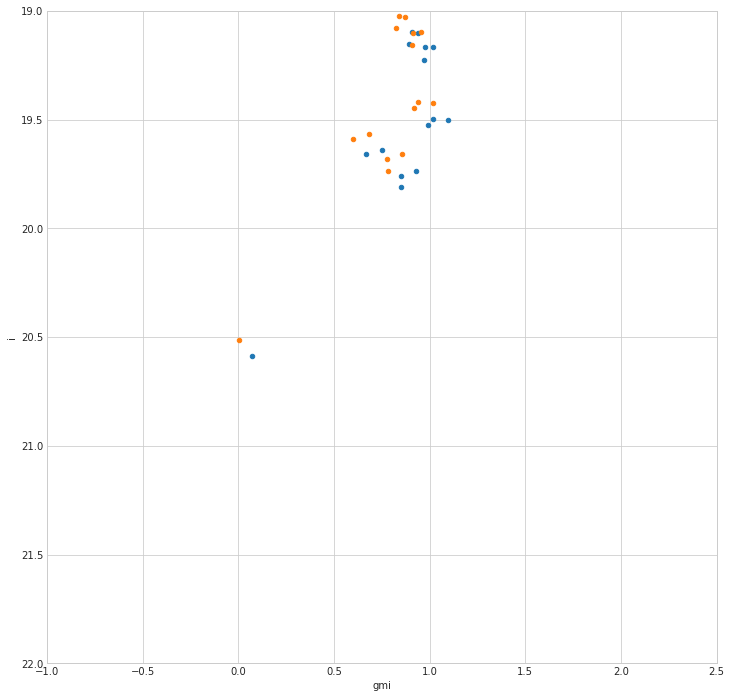

In [276]:
pltdf = pd.concat([matchres_cont[0][i] for i in np.where(matchres_cont[1] == 3)[0]])
pltdf["i"] = pltdf.psfMag_i - pltdf.extinction_i
pltdf["g"] = pltdf.psfMag_g - pltdf.extinction_g
pltdf["gmi"] = pltdf.g - pltdf.i
pltdf["psfMag_gmi"] = pltdf.psfMag_g - pltdf.psfMag_i
fig,ax = plt.subplots(1,1)
pltdf.plot.scatter("psfMag_gmi","psfMag_i",ax=ax,c="C0",figsize=(12,12))
pltdf.plot.scatter("gmi","i",ax=ax,c="C1")
plt.xlim((-1,2.5))
plt.ylim((22,19))

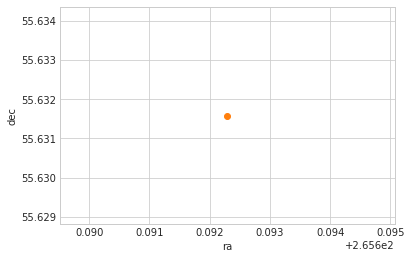

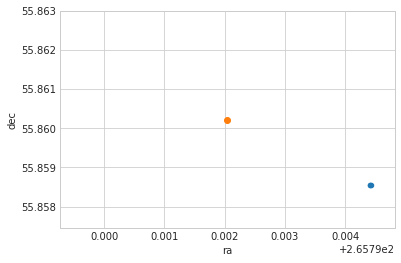

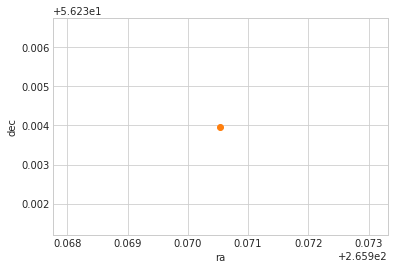

In [237]:
plot_around(df[df.RAdeg>264][matchres_cont[1] == 0],df_SDSS_cont,dx=10,dy=10)

### Merge the DataFrames

In [555]:
#df,candidates_matched_SDSS0_in_1arcsec,candidates_matched_SDSS0_in_1arcsec_lens
def Merge_CMD(df_spec,list_df_photo):
    '''
    df_spec: DataFrame of spectroscopic data
    df_photo: list of Dataframe of photometric data
    '''
    df_ret = pd.DataFrame(df_spec)
    g = np.array([(df.psfMag_g - df.extinction_g).mean() if len(df)>0 else np.nan for df in list_df_photo])
    i = np.array([(df.psfMag_i - df.extinction_i).mean() if len(df)>0 else np.nan for df in list_df_photo])
    gmi = g-i
    df_ret["i"] = i
    df_ret["gmi"] = gmi
    return df_ret[np.logical_not(np.isnan(df_ret.g))]

In [556]:
df_merged_SDSS0 = Merge_CMD(df,candidates_matched_SDSS0_in_1arcsec)
df_merged_SDSS0

,RAh,RAm,RAs,pmDEd,DEm,DEs,Vlos,e_Vlos,Teff,e_Teff,logg,e_logg,FeH,e_FeH,N,RAdeg,DEdeg,g,i,gmi
0,17,20,2.76,57,48,57.2,-294.1,2.6,5923,752,3.7,1.0,-1.30,0.70,1,260.011500,57.815889,19.596420,18.763429,0.832991
1,17,19,29.68,57,42,58.6,-205.1,1.1,4935,244,3.1,0.5,-1.73,0.32,1,259.873667,57.716278,20.031175,19.120320,0.910856
2,17,19,44.45,57,47,27.3,-283.1,1.1,5113,264,3.0,0.5,-1.90,0.31,2,259.935208,57.790917,20.156926,19.338944,0.817982
3,17,20,19.32,57,51,19.5,-277.5,1.1,4886,259,1.2,0.4,-1.89,0.31,1,260.080500,57.855417,20.001922,19.172152,0.829770
4,17,20,0.93,57,45,11.2,-297.8,0.7,4646,130,1.7,0.3,-1.67,0.17,3,260.003875,57.753111,20.243065,19.386744,0.856321
5,17,19,31.87,57,33,34.7,-309.9,0.4,4644,73,1.4,0.2,-3.24,0.07,5,259.882792,57.559639,18.371124,17.224474,1.146650
6,17,20,21.12,57,49,27.2,-294.9,0.4,4680,59,1.0,0.1,-1.73,0.07,2,260.088000,57.824222,18.087528,16.763811,1.323717
7,17,20,24.91,57,48,42.8,-310.9,1.0,4759,220,2.5,0.6,-1.69,0.29,2,260.103792,57.811889,20.103646,19.253720,0.849926
8,17,20,18.60,57,46,1.1,-302.8,0.5,4792,90,1.4,0.2,-1.97,0.11,2,260.077500,57.766972,19.229640,18.321878,0.907762
9,17,20,23.74,57,24,2.5,-63.0,0.8,5070,116,5.0,0.3,-1.25,0.14,1,260.098917,57.400694,19.730762,18.850052,0.880710


In [557]:
df_merged_SDSS1 = Merge_CMD(df_unmatched_SDSS0_in_1arcsec_ralessthan264,candidates_matched_SDSSdirty1but0_in_1arcsec)
df_merged_SDSS1

,RAh,RAm,RAs,pmDEd,DEm,DEs,Vlos,e_Vlos,Teff,e_Teff,logg,e_logg,FeH,e_FeH,N,RAdeg,DEdeg,g,i,gmi
33,17,23,27.45,57,52,1.0,-44.3,0.6,5816,109,5.3,0.2,-0.80,0.10,1,260.864375,57.866944,17.071140,16.329969,0.741171
54,17,20,16.16,58,4,4.8,-298.2,0.2,4683,41,1.0,0.1,-1.68,0.05,6,260.067333,58.068000,18.798084,17.665294,1.132790
68,17,18,35.69,58,0,50.4,-289.8,0.4,4816,77,1.1,0.2,-1.86,0.10,2,259.648708,58.014000,19.158182,18.122550,1.035632
79,17,17,39.04,57,43,17.2,-278.3,1.6,5089,481,2.0,0.8,-2.67,0.47,1,259.412667,57.721444,20.252390,19.459288,0.793102
92,17,22,33.51,57,48,3.8,-277.1,0.3,4781,66,1.6,0.2,-2.18,0.08,9,260.639625,57.801056,19.379599,18.454210,0.925389
119,17,21,36.80,57,58,37.0,-292.9,1.8,5029,414,2.0,0.8,-1.79,0.47,1,260.403333,57.976944,19.326937,18.401294,0.925642
128,17,22,10.70,57,53,57.4,-322.5,0.3,4481,43,0.9,0.1,-2.65,0.04,4,260.544583,57.899278,17.927232,16.593902,1.333330
131,17,19,23.72,57,47,22.8,-294.6,0.8,4903,222,2.2,0.5,-2.01,0.27,2,259.848833,57.789667,19.641813,18.684616,0.957197
142,17,21,52.47,57,52,36.8,-295.6,0.3,4804,58,1.5,0.2,-2.20,0.07,4,260.468625,57.876889,18.695464,17.570566,1.124899
153,17,20,35.56,57,56,7.9,-287.1,1.2,4506,150,1.1,0.3,-2.61,0.17,1,260.148167,57.935528,19.057845,18.186842,0.871003


In [558]:
df_merged_SDSScont = Merge_CMD(df_unmatched_SDSS0_in_1arcsec_ramorethan264,candidates_matched_SDSS_dirtycont_in_1arcsec)
df_merged_SDSScont

,RAh,RAm,RAs,pmDEd,DEm,DEs,Vlos,e_Vlos,Teff,e_Teff,logg,e_logg,FeH,e_FeH,N,RAdeg,DEdeg,g,i,gmi
506,17,40,7.40,55,48,57.8,-43.7,1.2,5055,171,4.9,0.4,-1.02,0.24,1,265.030833,55.816056,19.506335,18.641502,0.864833
507,17,39,15.69,55,43,24.0,-16.3,0.7,5024,68,5.4,0.2,-0.21,0.10,1,264.815375,55.723333,18.527223,17.380170,1.147053
508,17,39,59.28,55,48,46.5,-45.3,0.5,4899,64,5.0,0.2,0.26,0.08,1,264.997000,55.812917,18.177447,16.838146,1.339301
509,17,39,31.46,55,44,9.3,-21.6,0.8,5253,92,5.4,0.2,-0.45,0.15,1,264.881083,55.735917,19.207992,18.250824,0.957168
510,17,40,36.36,55,52,45.5,-81.2,1.4,5150,171,5.0,0.4,-1.04,0.27,1,265.151500,55.879306,20.114229,19.336762,0.777467
511,17,39,49.02,55,45,41.6,-8.2,0.5,4989,67,5.3,0.2,-0.20,0.08,1,264.954250,55.761556,18.477666,17.290994,1.186672
512,17,41,15.27,55,56,27.3,-38.2,0.5,4964,64,5.2,0.2,0.12,0.07,1,265.313625,55.940917,18.244912,16.972709,1.272203
513,17,39,58.12,55,43,4.0,-38.0,0.5,4742,63,5.1,0.2,-0.23,0.07,1,264.992167,55.717778,17.881851,16.328526,1.553325
514,17,40,16.31,55,44,41.7,-81.2,1.0,4971,121,5.4,0.2,-0.59,0.17,1,265.067958,55.744917,19.453105,18.561671,0.891434
515,17,40,1.16,55,39,49.9,-43.4,0.5,5118,68,5.3,0.2,-0.15,0.08,1,265.004833,55.663861,18.568956,17.489412,1.079544


In [559]:
df_merged_SDSSall = pd.concat([df_merged_SDSS0,df_merged_SDSS1,df_merged_SDSScont])
df_merged_SDSSall = df_merged_SDSSall.sort_index()
df_merged_SDSSall

,RAh,RAm,RAs,pmDEd,DEm,DEs,Vlos,e_Vlos,Teff,e_Teff,logg,e_logg,FeH,e_FeH,N,RAdeg,DEdeg,g,i,gmi
0,17,20,2.76,57,48,57.2,-294.1,2.6,5923,752,3.7,1.0,-1.30,0.70,1,260.011500,57.815889,19.596420,18.763429,0.832991
1,17,19,29.68,57,42,58.6,-205.1,1.1,4935,244,3.1,0.5,-1.73,0.32,1,259.873667,57.716278,20.031175,19.120320,0.910856
2,17,19,44.45,57,47,27.3,-283.1,1.1,5113,264,3.0,0.5,-1.90,0.31,2,259.935208,57.790917,20.156926,19.338944,0.817982
3,17,20,19.32,57,51,19.5,-277.5,1.1,4886,259,1.2,0.4,-1.89,0.31,1,260.080500,57.855417,20.001922,19.172152,0.829770
4,17,20,0.93,57,45,11.2,-297.8,0.7,4646,130,1.7,0.3,-1.67,0.17,3,260.003875,57.753111,20.243065,19.386744,0.856321
5,17,19,31.87,57,33,34.7,-309.9,0.4,4644,73,1.4,0.2,-3.24,0.07,5,259.882792,57.559639,18.371124,17.224474,1.146650
6,17,20,21.12,57,49,27.2,-294.9,0.4,4680,59,1.0,0.1,-1.73,0.07,2,260.088000,57.824222,18.087528,16.763811,1.323717
7,17,20,24.91,57,48,42.8,-310.9,1.0,4759,220,2.5,0.6,-1.69,0.29,2,260.103792,57.811889,20.103646,19.253720,0.849926
8,17,20,18.60,57,46,1.1,-302.8,0.5,4792,90,1.4,0.2,-1.97,0.11,2,260.077500,57.766972,19.229640,18.321878,0.907762
9,17,20,23.74,57,24,2.5,-63.0,0.8,5070,116,5.0,0.3,-1.25,0.14,1,260.098917,57.400694,19.730762,18.850052,0.880710


(22, 14)

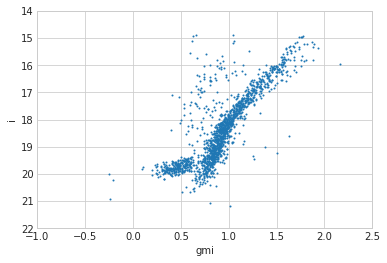

In [563]:
df_merged_SDSSall.plot.scatter("gmi","i",s=1)
plt.xlim((-1,2.5))
plt.ylim((22,14))

### MMT(after 1st matching) - SDSS1_PhotoPrimary (rectangle)

#### Data set: SDSS1_PhotoPrimary
The data set **SDSS1_PhotoPrimary** contains only the data of *Primary* stars.

array([1336, 1339, 1356, 1359])

Text(0.5,1,'PhotoPrimaryDR7')

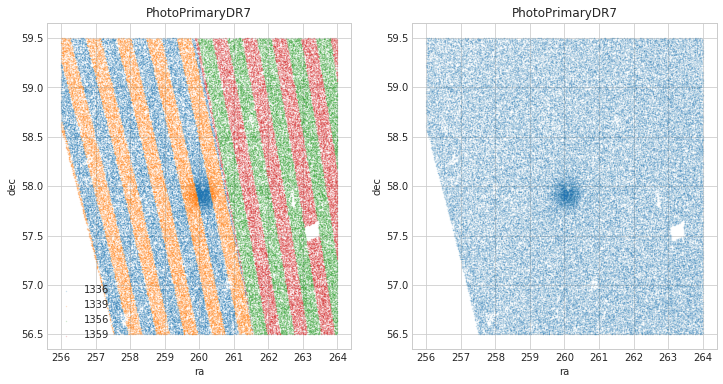

In [634]:
df_SDSS1_PhotoPrimary = pd.read_csv("Skyserver_SQL10_29_2018 6_43_46 AM_PhotoPrimaryDR7.csv",comment="#")

#df_SDSS2[::].plot.scatter("ra","dec",s=0.1,by="field",c=("C0","C1","C2","C3"))
#plt.figure(figsize=(12,12))
fig,axes = plt.subplots(1,2,figsize=(12,6))
keys = df_SDSS1_PhotoPrimary.run
unique_keys = np.unique(keys)
display(np.unique(keys))
cs = ["C{}".format(i) for i in range(len(unique_keys))]

[df_SDSS1_PhotoPrimary[keys==key].plot.scatter("ra","dec",s=0.1,label=str(key),alpha=0.3,ax=axes[0],c=c) for key,c in zip(unique_keys,cs)]
#[axes[0].scatter(df_SDSS1_PhotoPrimary[keys==key].ra,df_SDSS1_PhotoPrimary[keys==key].dec,s=0.1,label=str(key),alpha=0.3) for key in np.unique(keys)[:] ]
axes[0].legend()
axes[0].set_title("PhotoPrimaryDR7")
len(df_SDSS1_PhotoPrimary)

df_SDSS1_PhotoPrimary.plot.scatter("ra","dec",s=0.1,alpha=0.2,ax=axes[1])
axes[1].set_title("PhotoPrimaryDR7")
#axes[1].legend()

#### Matching

In [627]:
#display(len(df_unmatched_SDSS0_in_1arcsec_ralessthan264))
candidates_matched_SDSS1PhotoPrimarybut0_in_1arcsec,candidates_matched_SDSS1PhotoPrimarybut0_in_1arcsec_lens = matching(
    source=df_unmatched_SDSS0_in_1arcsec_ralessthan264,
    table=df_SDSS1_PhotoPrimary,
    angle_arcsec=2)
df_matched_SDSS1PhotoPrimarybut0_in_1arcsec = df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSS1PhotoPrimarybut0_in_1arcsec_lens==1]
df_unmatched_SDSS0and1PhotoPrimary_in_1arcsec = df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSS1PhotoPrimarybut0_in_1arcsec_lens==0]

[array([0, 1]), [39, 177]]

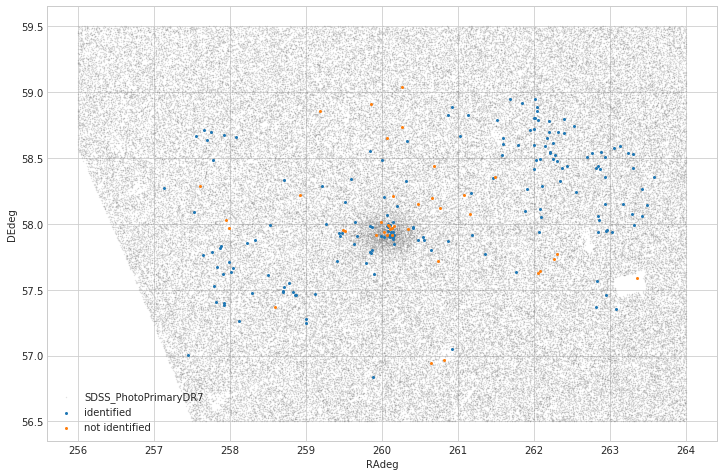

In [629]:
fig,ax = plt.subplots(1,1)
#display(df_matched_SDSS1PhotoPrimarybut0_in_1arcsec)
df_SDSS1_PhotoPrimary.plot.scatter("ra","dec",s=0.1,alpha=0.3,c="gray",ax=ax,figsize=(12,8),label="SDSS_PhotoPrimaryDR7")
df_matched_SDSS1PhotoPrimarybut0_in_1arcsec.plot.scatter("RAdeg","DEdeg",c="C0",ax=ax,label="identified",s=4)
df_unmatched_SDSS0and1PhotoPrimary_in_1arcsec.plot.scatter("RAdeg","DEdeg",c="C1",ax=ax,label="not identified",s=4)
plt.legend()

### MMT(after 1st matching) - SDSS1_PhotoObj.mode (rectangle)

#### Data set: SDSS1_PhotoPrimary
The data set **SDSS1** has a column **mode**: *Primary* (**mode** *=1*), *Secondary* (**mode** *=2*), and the *others*.

array([1, 2])

Text(0.5,1,'PhotoObj')

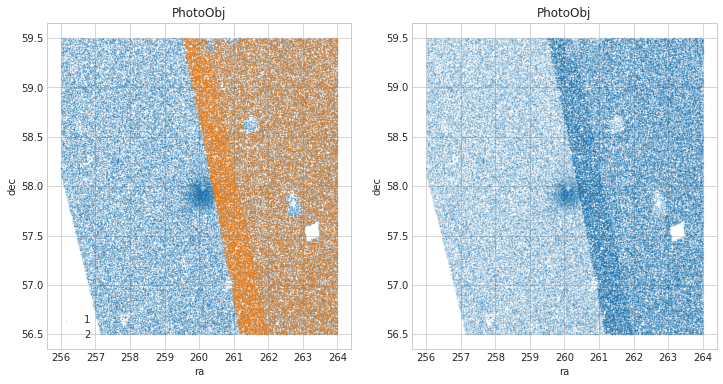

In [633]:
df_SDSS1_PhotoObjwMode = pd.read_csv("Skyserver_SQL10_29_2018 6_48_26 AM_PhotoObj_w_mode.csv",comment="#")

#df_SDSS2[::].plot.scatter("ra","dec",s=0.1,by="field",c=("C0","C1","C2","C3"))
#plt.figure(figsize=(12,12))
fig,axes = plt.subplots(1,2,figsize=(12,6))
keys = df_SDSS1_PhotoObjwMode["mode"]
unique_keys = np.unique(keys)
display(np.unique(keys))
cs = ["C{}".format(i) for i in range(len(unique_keys))]

[df_SDSS1_PhotoPrimary[keys==key].plot.scatter("ra","dec",s=0.1,label=str(key),alpha=0.3,ax=axes[0],c=c) for key,c in zip(unique_keys,cs)]
#[axes[0].scatter(df_SDSS1_PhotoPrimary[keys==key].ra,df_SDSS1_PhotoPrimary[keys==key].dec,s=0.1,label=str(key),alpha=0.3) for key in np.unique(keys)[:] ]
axes[0].legend()
axes[0].set_title("PhotoObj")
len(df_SDSS1_PhotoPrimary)

df_SDSS1_PhotoPrimary.plot.scatter("ra","dec",s=0.1,alpha=0.2,ax=axes[1])
axes[1].set_title("PhotoObj")
#axes[1].legend()

#### Matching

In [642]:
#display(len(df_unmatched_SDSS0_in_1arcsec_ralessthan264))
candidates_matched_SDSS1PhotoObjwModebut0_in_1arcsec,candidates_matched_SDSS1PhotoObjwModebut0_in_1arcsec_lens = matching(
    source=df_unmatched_SDSS0_in_1arcsec_ralessthan264,
    table=df_SDSS1_PhotoObjwMode[df_SDSS1_PhotoObjwMode["mode"]==1],
    angle_arcsec=2)
df_matched_SDSS1PhotoObjwModebut0_in_1arcsec = df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSS1PhotoObjwModebut0_in_1arcsec_lens==1]
df_unmatched_SDSS0and1PhotoObjwMode_in_1arcsec = df_unmatched_SDSS0_in_1arcsec_ralessthan264[candidates_matched_SDSS1PhotoObjwModebut0_in_1arcsec_lens==0]

[array([0, 1]), [44, 172]]

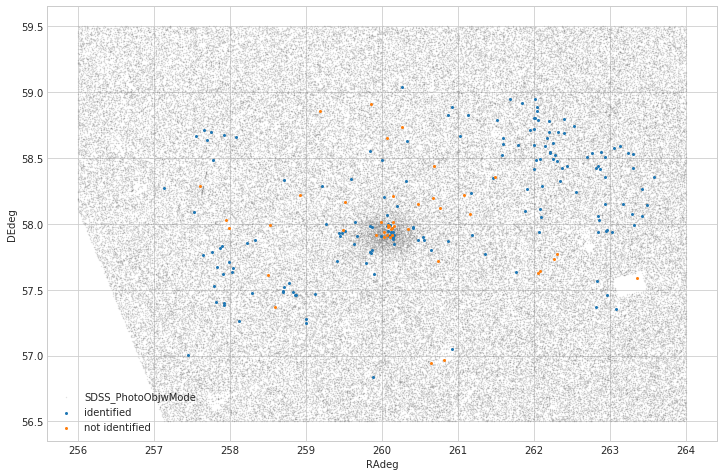

In [643]:
fig,ax = plt.subplots(1,1)
#display(df_matched_SDSS1PhotoPrimarybut0_in_1arcsec)
df_SDSS1_PhotoObjwMode[df_SDSS1_PhotoObjwMode["mode"]==1].plot.scatter("ra","dec",s=0.1,alpha=0.3,c="gray",ax=ax,figsize=(12,8),label="SDSS_PhotoObjwMode")
df_matched_SDSS1PhotoObjwModebut0_in_1arcsec.plot.scatter("RAdeg","DEdeg",c="C0",ax=ax,label="identified",s=4)
df_unmatched_SDSS0and1PhotoObjwMode_in_1arcsec.plot.scatter("RAdeg","DEdeg",c="C1",ax=ax,label="not identified",s=4)
plt.legend()

## Merge DF

In [646]:
#df_merged_SDSS0 = Merge_CMD(df,candidates_matched_SDSS0_in_1arcsec)
#df_merged_SDSS0
df_merged_SDSS1_PhotoPrimary = Merge_CMD(df_unmatched_SDSS0_in_1arcsec_ralessthan264,candidates_matched_SDSS1PhotoPrimarybut0_in_1arcsec)
#df_merged_SDSS1_PhotoPrimary
#df_merged_SDSScont = Merge_CMD(df_unmatched_SDSS0_in_1arcsec_ramorethan264,candidates_matched_SDSS_dirtycont_in_1arcsec)
#df_merged_SDSScont

In [647]:
df_merged_complete = pd.concat((df_merged_SDSS0,df_merged_SDSS1_PhotoPrimary,df_merged_SDSScont))

(22, 14)

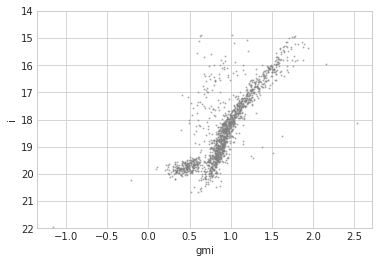

In [650]:
df_merged_complete.plot.scatter("gmi","i",s=1,c="gray",alpha=0.5)
plt.ylim((22,14))

In [653]:
is_inpoly = inpoly(x=cut[:,0],y=cut[:,1],sx=df_merged_complete.gmi.values,sy=df_merged_complete.i.values)
is_inpoly

[[ 0.55315883  0.84641732  1.07295951  2.1573286   1.74087863  0.77390458
   0.684392   -0.05496306 -0.35504897 -0.37905951  0.13744201  0.6009508 ]
 [20.74180652 20.73951544 18.23774558 14.69802394 14.71690246 18.19320694
  19.24078126 19.48093247 20.13952689 20.51471447 20.26067931 20.14768314]]
[[ 0.84641732  1.07295951  2.1573286   1.74087863  0.77390458  0.684392
  -0.05496306 -0.35504897 -0.37905951  0.13744201  0.6009508   0.55315883]
 [20.73951544 18.23774558 14.69802394 14.71690246 18.19320694 19.24078126
  19.48093247 20.13952689 20.51471447 20.26067931 20.14768314 20.74180652]]


/home/gomesu/workspace/git_code/modKI17/Draco/inpoly.py:29: RuntimeWarning: invalid value encountered in less
  ispointbetweenithsep = (x1-sx)*(x2-sx)<0
/home/gomesu/workspace/git_code/modKI17/Draco/inpoly.py:30: RuntimeWarning: invalid value encountered in greater
  ispointaboveithsep = (x2-x1)*((x2-x1)*(sy-y1)-(y2-y1)*(sx-x1))>0


array([ True,  True,  True, ...,  True,  True,  True])

(22, 14)

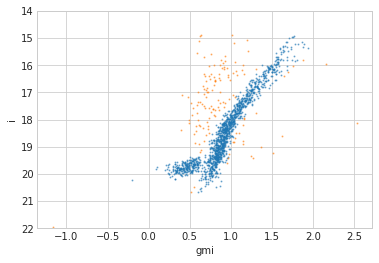

In [658]:
fig,ax=plt.subplots(1,1)
df_merged_complete[is_inpoly].plot.scatter("gmi","i",s=1,c="C0",alpha=0.5,ax=ax)
df_merged_complete[np.logical_not(is_inpoly)].plot.scatter("gmi","i",s=1,c="C1",alpha=0.5,ax=ax)
plt.ylim((22,14))

In [659]:
df_merged_complete["InCutPoly"] = is_inpoly

In [660]:
df_merged_complete.to_csv("dra_sspp2_RADEdeg_merged_SDSS.csv",index=None)

In [662]:
(np.sum(is_inpoly),np.sum(np.logical_not(is_inpoly)))

(1370, 142)